<a href="https://colab.research.google.com/github/NithyaStanly/internship/blob/main/day5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

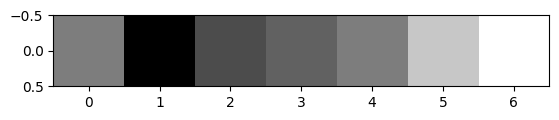

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
gray_image = np.array([[128,5,80,100,128,200,255]],dtype=np.uint8)
plt.imshow(gray_image,cmap="gray")
plt.show()

In [ ]:
gray_image.shape

(1, 7)

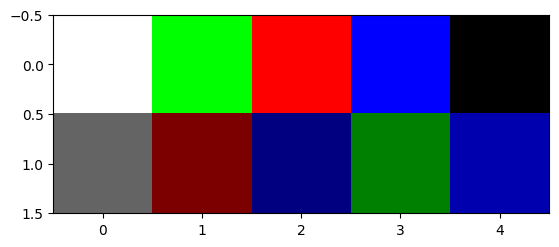

In [ ]:
rgb_image = np.array([
    [ [255,255,255],[0,255,0],[255,0,0],[0,0,255],[0,0,0]],
    [ [100,100,100],[125,0,0],[0,0,128],[0,128,0],[0,0,175]]
])

plt.imshow(rgb_image)
plt.show()

In [ ]:
rgb_image.shape

(2, 5, 3)

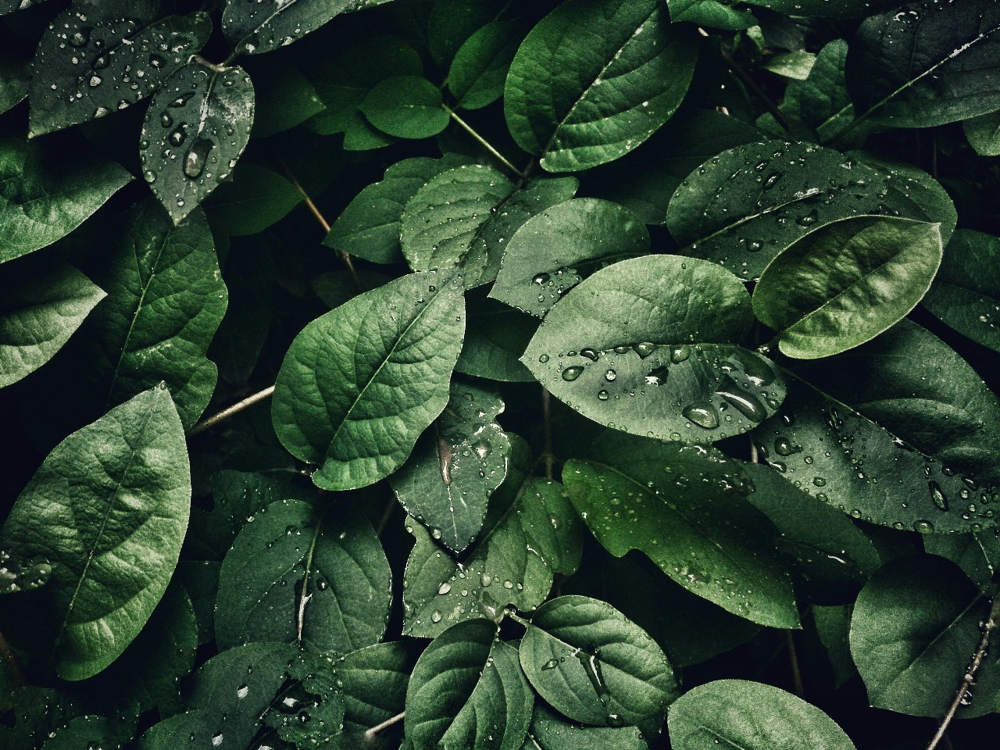

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
image = cv2.imread('/content/WhatsApp Image 2025-06-20 at 10.12.39_0381b42e.jpg')
cv2_imshow(image)

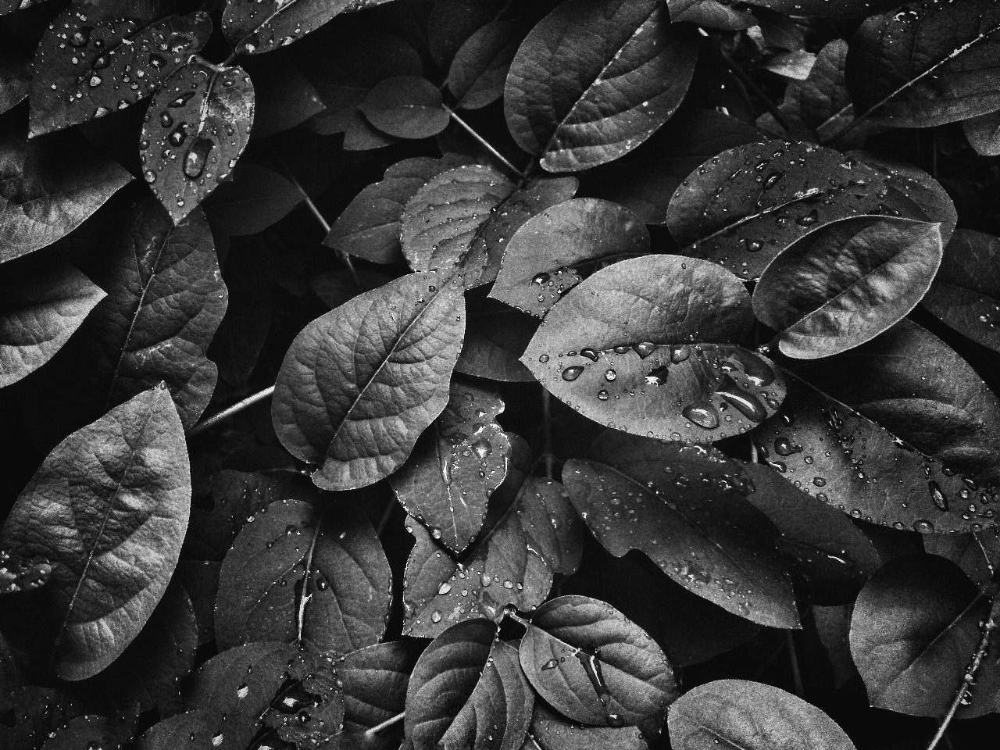

In [ ]:
img_gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cv2_imshow(img_gray)

In [ ]:
img_gray.shape


(960, 1280)

In [ ]:
image.shape

(960, 1280, 3)

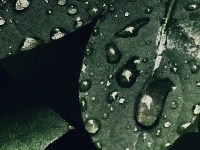

In [ ]:
cv2_imshow(image[100:250,100:300])

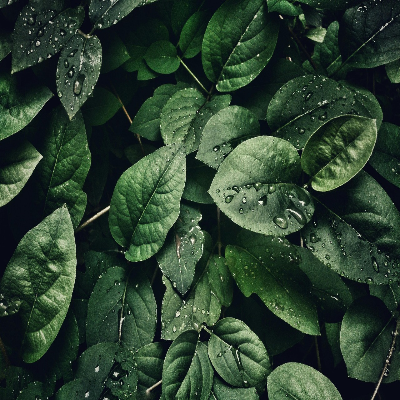

In [ ]:
resized = cv2.resize(image,(400,400))
cv2_imshow(resized)

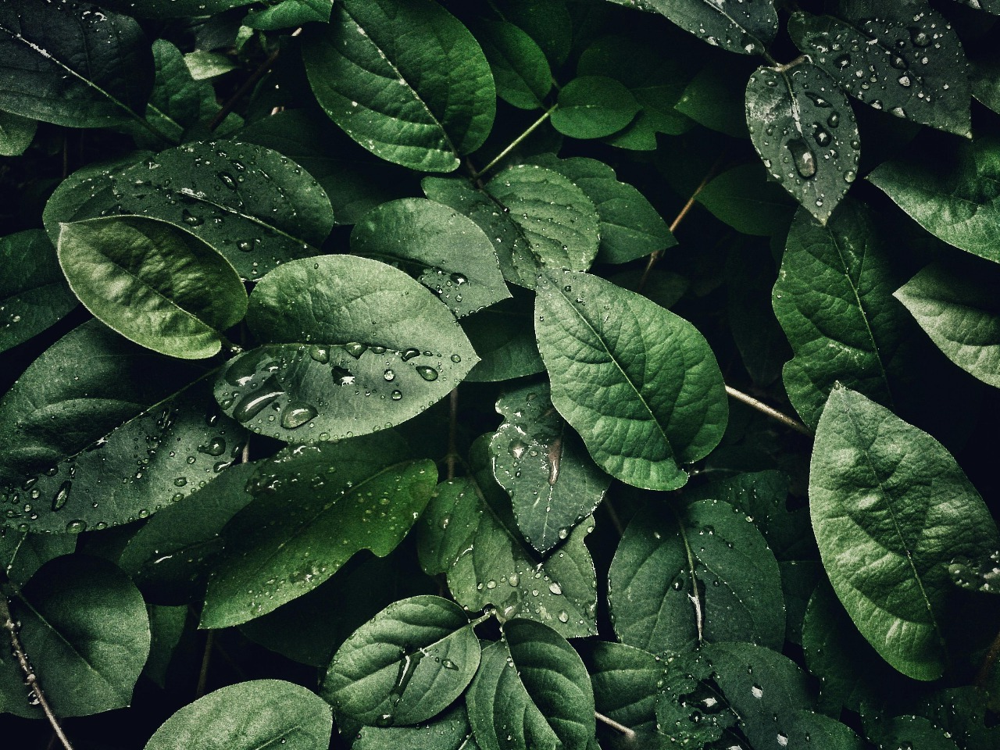

In [ ]:
flip_img = cv2.flip(image,1)
cv2_imshow(flip_img)


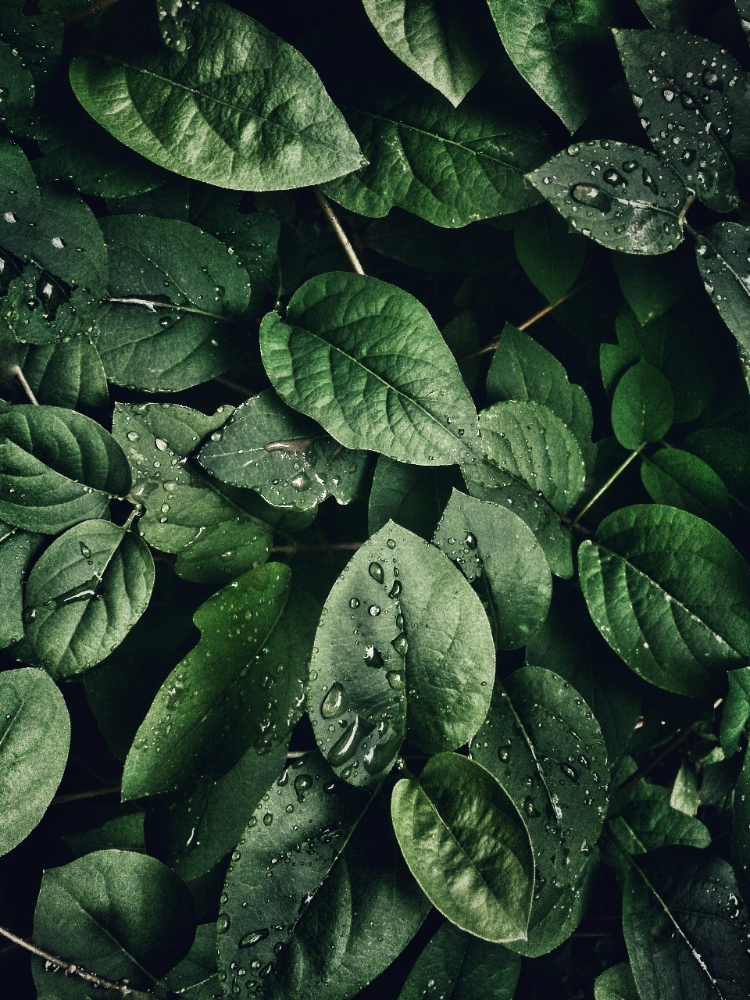

In [ ]:
rotate_img = cv2.rotate(image,cv2.ROTATE_90_CLOCKWISE)
cv2_imshow(rotate_img)

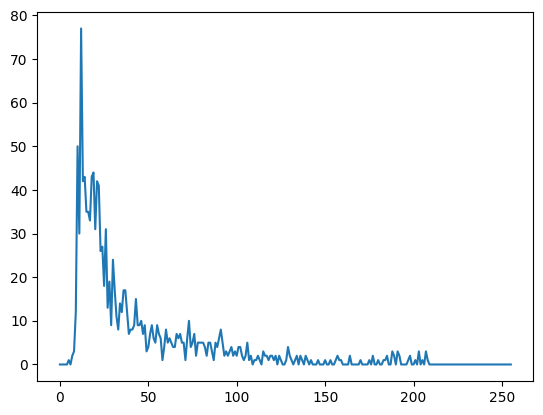

In [ ]:
import matplotlib.pyplot as plt
histr = cv2.calcHist(img_gray,[1],None,[256],[0,256])
plt.plot(histr)
plt.show()

In [ ]:
img_gray

array([[59, 53, 44, ..., 16, 20,  9],
       [55, 61, 56, ..., 14, 28, 18],
       [38, 60, 49, ..., 29, 16, 11],
       ...,
       [17, 17, 17, ..., 10, 10, 10],
       [17, 18, 19, ..., 10, 10, 10],
       [20, 21, 22, ..., 10, 10, 10]], dtype=uint8)

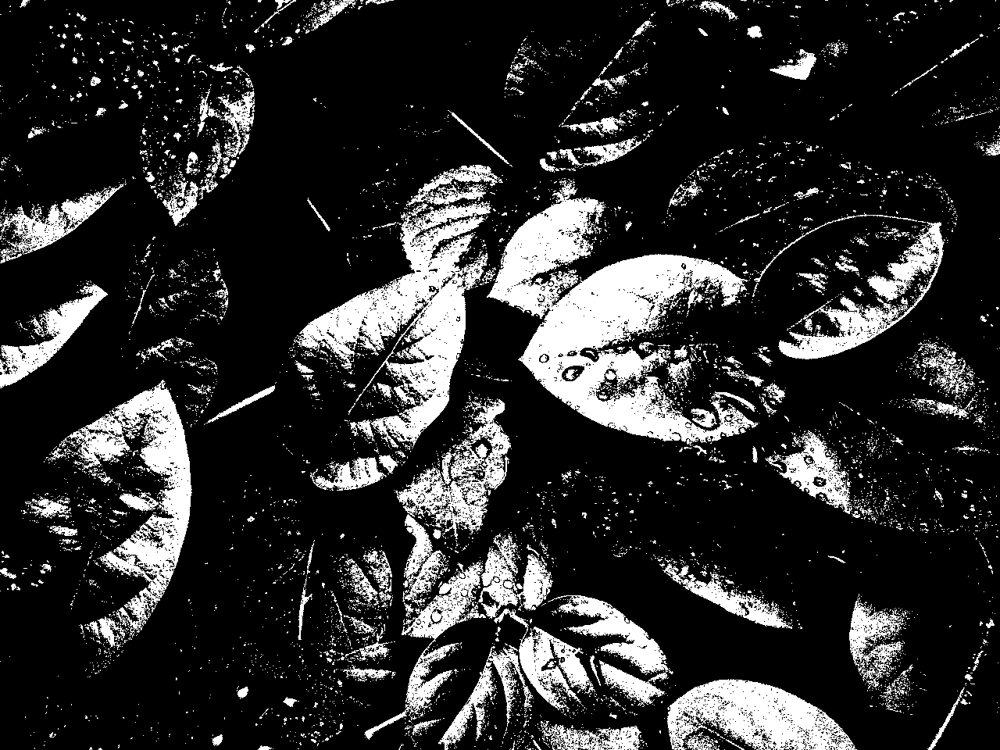

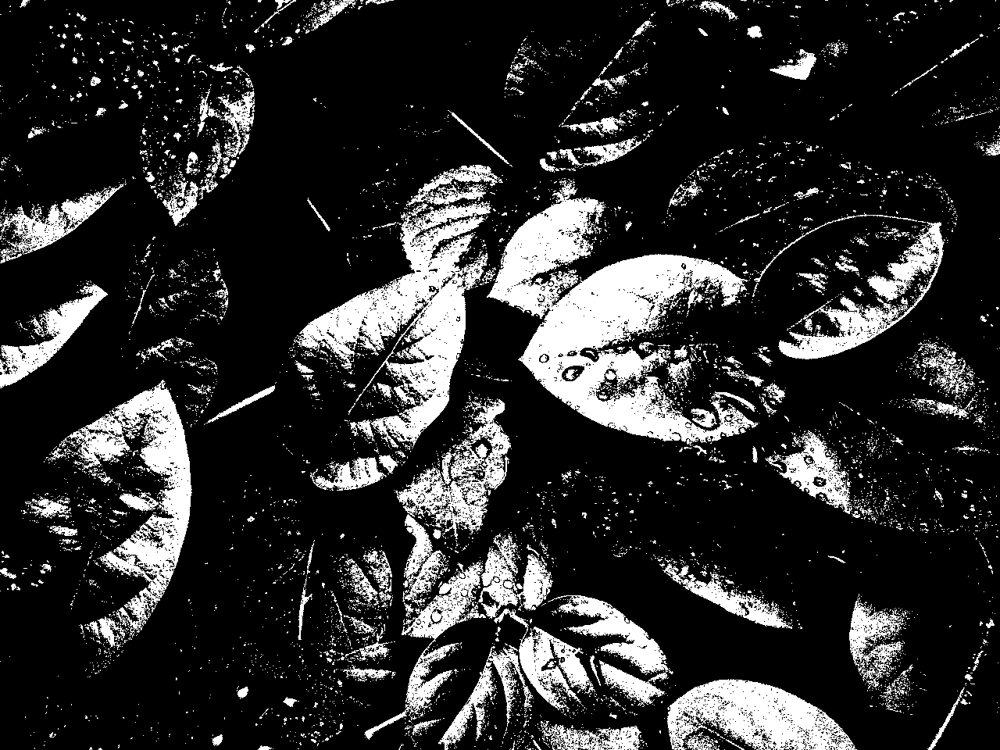

In [ ]:
img_gray[img_gray>100] = 255
img_gray[img_gray<=100] = 0
cv2_imshow(img_gray)

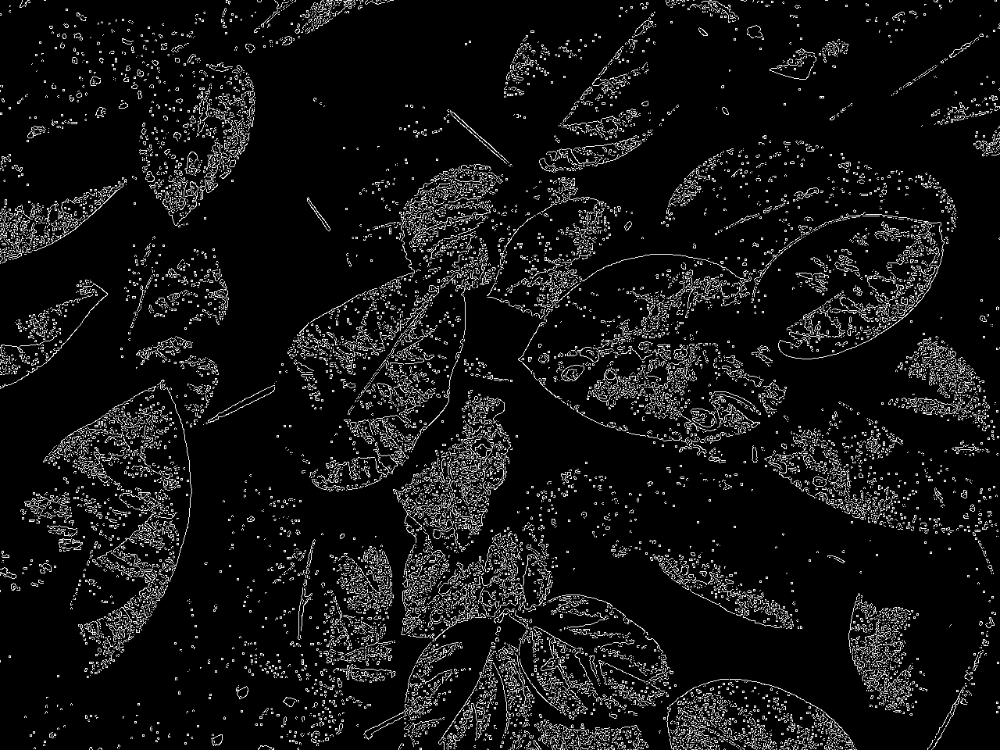

In [ ]:
edges = cv2.Canny(img_gray,100,200)
cv2_imshow(edges)

NLP

In [ ]:
import numpy as np
import pandas as pd
import nltk


remove stopwords

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
from nltk.corpus import stopwords
stopWrd = stopwords.words('english')
stopWrd

['a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 'her',
 'here',
 'hers',
 'herself',
 "he's",
 'him',
 'himself',
 'his',
 'how',
 'i',
 "i'd",
 'if',
 "i'll",
 "i'm",
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it'd",
 "it'll",
 "it's",
 'its',
 'itself',
 "i've",
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'on

In [ ]:
url = "https://raw.githubusercontent.com/justmarkham/pycon-2016-tutorial/master/data/sms.tsv"
df = pd.read_csv(url,sep="\t",header=None,names=['label','message'])
pd.set_option('display.max_colwidth',150)
df.head(10)

,label,message
0,ham,"Go until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 0845281007...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives around here though"
5,spam,"FreeMsg Hey there darling it's been 3 week's now and no word back! I'd like some fun you up for it still? Tb ok! XxX std chgs to send, £1.50 to rcv"
6,ham,Even my brother is not like to speak with me. They treat me like aids patent.
7,ham,As per your request 'Melle Melle (Oru Minnaminunginte Nurungu Vettam)' has been set as your callertune for all Callers. Press *9 to copy your frie...
8,spam,WINNER!! As a valued network customer you have been selected to receivea £900 prize reward! To claim call 09061701461. Claim code KL341. Valid 12 ...
9,spam,Had your mobile 11 months or more? U R entitled to Update to the latest colour mobiles with camera for Free! Call The Mobile Update Co FREE on 080...


In [ ]:
df['label'].value_counts()

,count
label,
ham,4825
spam,747


In [ ]:
import string
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
def preprocess_text(text):
  text = text.lower()
  text = text.translate(str.maketrans("","",string.punctuation))
  tokens = nltk.word_tokenize(text)
  tokens = [word for word in tokens if word not in stopWrd]
  tokens = [stemmer.stem(word)for word in tokens]
  cleantext = " ".join(tokens)
  return cleantext


In [ ]:
df['cleaned_message'] = df['message'].apply(preprocess_text)
df.head()

,label,message,cleaned_message,cleaned message
0,ham,"Go until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...",go jurong point crazi avail bugi n great world la e buffet cine got amor wat,go jurong point crazi avail bugi n great world la e buffet cine got amor wat
1,ham,Ok lar... Joking wif u oni...,ok lar joke wif u oni,ok lar joke wif u oni
2,spam,Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 0845281007...,free entri 2 wkli comp win fa cup final tkt 21st may 2005 text fa 87121 receiv entri questionstd txt ratetc appli 08452810075over18,free entri 2 wkli comp win fa cup final tkt 21st may 2005 text fa 87121 receiv entri questionstd txt ratetc appli 08452810075over18
3,ham,U dun say so early hor... U c already then say...,u dun say earli hor u c alreadi say,u dun say earli hor u c alreadi say
4,ham,"Nah I don't think he goes to usf, he lives around here though",nah dont think goe usf live around though,nah dont think goe usf live around though


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
data= [
    "The quick brown fox.",
    "Never jump over the dog quickly.",
    "A fox is quick and it is jumping high.",
    "The dogs are not fast."
]
X = cv.fit_transform(data)
print(cv.get_feature_names_out())
print(X.toarray())

['and' 'are' 'brown' 'dog' 'dogs' 'fast' 'fox' 'high' 'is' 'it' 'jump'
 'jumping' 'never' 'not' 'over' 'quick' 'quickly' 'the']
[[0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 1]
 [0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 0 1 1]
 [1 0 0 0 0 0 1 1 2 1 0 1 0 0 0 1 0 0]
 [0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 1]]


In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
from nltk.stem import PorterStemmer
stemmer = PorterStemmer()
stemmer.stem("reads")

'read'

In [ ]:
stemmer.stem('strengthen')

'strengthen'

In [ ]:
stemmer.stem('strongly')

'strongli'

In [ ]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
wnl = nltk.WordNetLemmatizer()
wnl.lemmatize('STRONGLY')

'STRONGLY'

In [ ]:
wnl = nltk.WordNetLemmatizer()
wnl.lemmatize('STRONGLY')

'STRONGLY'

In [ ]:
df['cleaned message'] = df['message'].apply(preprocess_text)
df.head()

,label,message,cleaned_message,cleaned message
0,ham,"Go until jurong point, crazy.. Available only in bugis n great world la e buffet... Cine there got amore wat...",go jurong point crazi avail bugi n great world la e buffet cine got amor wat,go jurong point crazi avail bugi n great world la e buffet cine got amor wat
1,ham,Ok lar... Joking wif u oni...,ok lar joke wif u oni,ok lar joke wif u oni
2,spam,Free entry in 2 a wkly comp to win FA Cup final tkts 21st May 2005. Text FA to 87121 to receive entry question(std txt rate)T&C's apply 0845281007...,free entri 2 wkli comp win fa cup final tkt 21st may 2005 text fa 87121 receiv entri questionstd txt ratetc appli 08452810075over18,free entri 2 wkli comp win fa cup final tkt 21st may 2005 text fa 87121 receiv entri questionstd txt ratetc appli 08452810075over18
3,ham,U dun say so early hor... U c already then say...,u dun say earli hor u c alreadi say,u dun say earli hor u c alreadi say
4,ham,"Nah I don't think he goes to usf, he lives around here though",nah dont think goe usf live around though,nah dont think goe usf live around though


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
X = cv.fit_transform(df['cleaned_message'])
print(len(cv.get_feature_names_out()))
#print(X.toarray())

8092


In [ ]:
def tokenize(text):
  df['tokenized_message '] = df['cleaned_message'].apply(tokenize)

In [ ]:
y=df['label'].map({'ham':0,'spam':1})
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [ ]:
print(X_train.shape,y_train.shape,X_test.shape,y_test.shape)

(4457, 8092) (4457,) (1115, 8092) (1115,)


In [ ]:
model = MultinomialNB()
model.fit(X_train,y_train)
pred = model.predict(X_test)

print(confusion_matrix(y_test,pred))
print(accuracy_score(y_test,pred))
print(classification_report(y_test,pred))

[[951  15]
 [  7 142]]
0.9802690582959641
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       966
           1       0.90      0.95      0.93       149

    accuracy                           0.98      1115
   macro avg       0.95      0.97      0.96      1115
weighted avg       0.98      0.98      0.98      1115

